In [2]:
import pandas as pd
from mp_api.client import MPRester

api_key = "GnR0eFNqClPWDPWLOnCV4HYNvp70Nwar"

fields = [
    "material_id", "formula_pretty", "symmetry", "bulk_modulus", "shear_modulus", "composition", "structure",
    "formation_energy_per_atom", "band_gap", "energy_above_hull", "density", "volume", "nsites"
]

with MPRester(api_key) as mpr:
    docs = mpr.materials.summary.search(
        fields=fields,
        all_fields=False,
        chunk_size=1000,
        num_chunks=10  # Adjust or remove for more data
    )

df_mp = pd.DataFrame([doc.dict() for doc in docs])

# Save to CSV (or use .to_pickle for more complex objects)
df_mp.to_csv("materials_data_10k.csv", index=False)
# For objects like 'structure', use pickle:
# df_mp.to_pickle("materials_data.pkl")

Retrieving SummaryDoc documents:   0%|          | 0/10000 [00:00<?, ?it/s]

In [3]:
df_mp = pd.read_csv("materials_data_10k.csv")

## Data cleaning and analysis

In [4]:
df_mp.head()  # Display the first few rows of the DataFrame

,builder_meta,nsites,elements,nelements,composition,composition_reduced,formula_pretty,formula_anonymous,chemsys,volume,...,weighted_surface_energy,weighted_work_function,surface_anisotropy,shape_factor,has_reconstructed,possible_species,has_props,theoretical,database_IDs,fields_not_requested
0,NaN,10,NaN,NaN,{'O': 10.0},NaN,O2,NaN,NaN,159.269552,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"['builder_meta', 'elements', 'nelements', 'com..."
1,NaN,100,NaN,NaN,{'C': 100.0},NaN,C,NaN,NaN,1190.353192,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"['builder_meta', 'elements', 'nelements', 'com..."
2,NaN,100,NaN,NaN,{'Ti': 100.0},NaN,Ti,NaN,NaN,1744.318224,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"['builder_meta', 'elements', 'nelements', 'com..."
3,NaN,100,NaN,NaN,{'Si': 100.0},NaN,Si,NaN,NaN,1793.764938,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"['builder_meta', 'elements', 'nelements', 'com..."
4,NaN,12,NaN,NaN,{'Nb': 12.0},NaN,Nb,NaN,NaN,226.839615,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"['builder_meta', 'elements', 'nelements', 'com..."


In [5]:
df_mp = df_mp[df_mp["band_gap"].notnull()]
df_mp.head()  # Display the first few rows of the filtered DataFrame

print(df_mp["band_gap"])  # Print summary statistics of the band gap

0       0.0423
1       0.1060
2       0.0000
3       0.0000
4       0.0000
         ...  
9995    0.0000
9996    5.4564
9997    0.0000
9998    0.0000
9999    0.0000
Name: band_gap, Length: 10000, dtype: float64


In [6]:

print(df_mp["formula_pretty"])  # Print detailed statistics of the composition

0           O2
1            C
2           Ti
3           Si
4           Nb
         ...  
9995    Pr5Ge3
9996      PrF3
9997    Sc5Sn3
9998    Nd5Ge3
9999    Sr5As3
Name: formula_pretty, Length: 10000, dtype: object


In [7]:
df_mp["band_gap"].describe()  # Print summary statistics of the band gap

count    10000.000000
mean         0.554004
std          1.323171
min          0.000000
25%          0.000000
50%          0.000000
75%          0.164975
max         17.891400
Name: band_gap, dtype: float64

In [8]:
df_mp.columns

Index(['builder_meta', 'nsites', 'elements', 'nelements', 'composition',
       'composition_reduced', 'formula_pretty', 'formula_anonymous', 'chemsys',
       'volume', 'density', 'density_atomic', 'symmetry', 'property_name',
       'material_id', 'deprecated', 'deprecation_reasons', 'last_updated',
       'origins', 'warnings', 'structure', 'task_ids',
       'uncorrected_energy_per_atom', 'energy_per_atom',
       'formation_energy_per_atom', 'energy_above_hull', 'is_stable',
       'equilibrium_reaction_energy_per_atom', 'decomposes_to', 'xas',
       'grain_boundaries', 'band_gap', 'cbm', 'vbm', 'efermi', 'is_gap_direct',
       'is_metal', 'es_source_calc_id', 'bandstructure', 'dos',
       'dos_energy_up', 'dos_energy_down', 'is_magnetic', 'ordering',
       'total_magnetization', 'total_magnetization_normalized_vol',
       'total_magnetization_normalized_formula_units', 'num_magnetic_sites',
       'num_unique_magnetic_sites', 'types_of_magnetic_species',
       'bulk_modulus

In [9]:
unwanted_columns = ["builder_meta", "formula_anonymous", "property_name", "deprecated", 
                    "deprecated_reason", "last_updated", "last_updated_by", "origins", "warnings", "task_ids", "uncorrected_energy_per_atom", "is_stable", "is_metal", 
                    "equilibrum_reaction_energy_per_atom", "decomposes_to", "xas", "es_source_calc_id", "dos", "bandstructure", "dos_energy_up", "dos_energy_down",
                    "is_magnetic", "ordering", "total_magnetization", "total_magnetization_normalized_vol", "total_magnetization_normalized_formula_units", "num_magnetic_sites", 
                    "num_unique_magnetic_sites", "types_of_magnetic_species", "universal_anisotropy", "homogenous_poisson", "e_total", "e_ionic", "e_elctronic", "n", "e_ij_max", 
                    "weightded_sace_energy_EV_PER_ANG2", "weighted_surface_energy", "weighted_work_function","surface_anisotropy", "shape_factor", "has_reconstructed",
                     "possible_species", "has_props", "theoretical", "database_IDs", "fields_not_requested"]
# Remove unwanted columns
df_mp = df_mp.drop(columns=unwanted_columns, errors='ignore')

In [10]:
df_mp.columns  # Display remaining columns after cleanup

Index(['nsites', 'elements', 'nelements', 'composition', 'composition_reduced',
       'formula_pretty', 'chemsys', 'volume', 'density', 'density_atomic',
       'symmetry', 'material_id', 'deprecation_reasons', 'structure',
       'energy_per_atom', 'formation_energy_per_atom', 'energy_above_hull',
       'equilibrium_reaction_energy_per_atom', 'grain_boundaries', 'band_gap',
       'cbm', 'vbm', 'efermi', 'is_gap_direct', 'bulk_modulus',
       'shear_modulus', 'homogeneous_poisson', 'e_electronic',
       'weighted_surface_energy_EV_PER_ANG2'],
      dtype='object')

In [11]:
df_mp = df_mp.drop(columns=["deprecation_reasons","equilibrum_reaction_energy_per_atom", "deprecation_reasons", "equilibrum_reaction_energy_per_atom", "grain_boundaries", 
                            "cbm", "vbm", "efermi", "is_gap_direct", "homogenous_poisson", "e_electronic", "weighted_surface_energy_EV_PER_ANG2"], errors='ignore')

In [12]:
df_mp.columns  # Display remaining columns after cleanup

Index(['nsites', 'elements', 'nelements', 'composition', 'composition_reduced',
       'formula_pretty', 'chemsys', 'volume', 'density', 'density_atomic',
       'symmetry', 'material_id', 'structure', 'energy_per_atom',
       'formation_energy_per_atom', 'energy_above_hull',
       'equilibrium_reaction_energy_per_atom', 'band_gap', 'bulk_modulus',
       'shear_modulus', 'homogeneous_poisson'],
      dtype='object')

In [13]:
df_mp["elements"]

0      NaN
1      NaN
2      NaN
3      NaN
4      NaN
        ..
9995   NaN
9996   NaN
9997   NaN
9998   NaN
9999   NaN
Name: elements, Length: 10000, dtype: float64

In [14]:
df_mp.describe()  # Display summary statistics of the DataFrame

,nsites,elements,nelements,composition_reduced,chemsys,volume,density,density_atomic,energy_per_atom,formation_energy_per_atom,energy_above_hull,equilibrium_reaction_energy_per_atom,band_gap,homogeneous_poisson
count,10000.000000,0.0,0.0,0.0,0.0,10000.000000,10000.000000,0.0,0.0,10000.000000,10000.000000,0.0,10000.000000,0.0
mean,19.264900,NaN,NaN,NaN,NaN,420.180707,6.157545,NaN,NaN,-0.530917,0.187087,NaN,0.554004,NaN
std,27.937197,NaN,NaN,NaN,NaN,676.539814,3.853256,NaN,NaN,1.030947,0.399473,NaN,1.323171,NaN
min,1.000000,NaN,NaN,NaN,NaN,5.610269,0.023670,NaN,NaN,-4.508269,0.000000,NaN,0.000000,NaN
25%,4.000000,NaN,NaN,NaN,NaN,88.116893,3.069802,NaN,NaN,-0.857617,0.002236,NaN,0.000000,NaN
50%,8.000000,NaN,NaN,NaN,NaN,178.659562,5.428635,NaN,NaN,-0.235716,0.055468,NaN,0.000000,NaN
75%,20.000000,NaN,NaN,NaN,NaN,428.493089,8.309248,NaN,NaN,0.044985,0.219726,NaN,0.164975,NaN
max,360.000000,NaN,NaN,NaN,NaN,10887.909463,26.581336,NaN,NaN,8.992692,9.713490,NaN,17.891400,NaN


In [15]:

df_mp.info()  # Display DataFrame information, including data types and non-null counts

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 21 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   nsites                                10000 non-null  int64  
 1   elements                              0 non-null      float64
 2   nelements                             0 non-null      float64
 3   composition                           10000 non-null  object 
 4   composition_reduced                   0 non-null      float64
 5   formula_pretty                        10000 non-null  object 
 6   chemsys                               0 non-null      float64
 7   volume                                10000 non-null  float64
 8   density                               10000 non-null  float64
 9   density_atomic                        0 non-null      float64
 10  symmetry                              10000 non-null  object 
 11  material_id     

In [16]:
len(df_mp["band_gap"])

10000

In [17]:
#Drop columns with all NaN values
df_mp = df_mp.dropna(axis=1, how='all')

In [18]:
df_mp.info()  # Display DataFrame information

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 13 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   nsites                     10000 non-null  int64  
 1   composition                10000 non-null  object 
 2   formula_pretty             10000 non-null  object 
 3   volume                     10000 non-null  float64
 4   density                    10000 non-null  float64
 5   symmetry                   10000 non-null  object 
 6   material_id                10000 non-null  object 
 7   structure                  10000 non-null  object 
 8   formation_energy_per_atom  10000 non-null  float64
 9   energy_above_hull          10000 non-null  float64
 10  band_gap                   10000 non-null  float64
 11  bulk_modulus               2069 non-null   object 
 12  shear_modulus              2069 non-null   object 
dtypes: float64(5), int64(1), object(7)
memory usage

## Featurization

In [20]:
df_mp.head()

,nsites,composition,formula_pretty,volume,density,symmetry,material_id,structure,formation_energy_per_atom,energy_above_hull,band_gap,bulk_modulus,shear_modulus
0,10,{'O': 10.0},O2,159.269552,1.668092,"{'crystal_system': 'Triclinic', 'symbol': 'P1'...",mp-1180064,"{'@module': 'pymatgen.core.structure', '@class...",0.387014,0.387014,0.0423,NaN,NaN
1,100,{'C': 100.0},C,1190.353192,1.675489,"{'crystal_system': 'Triclinic', 'symbol': 'P1'...",mp-1244913,"{'@module': 'pymatgen.core.structure', '@class...",0.994253,0.994253,0.1060,NaN,NaN
2,100,{'Ti': 100.0},Ti,1744.318224,4.556796,"{'crystal_system': 'Triclinic', 'symbol': 'P1'...",mp-1245006,"{'@module': 'pymatgen.core.structure', '@class...",0.141384,0.141384,0.0000,NaN,NaN
3,100,{'Si': 100.0},Si,1793.764938,2.599954,"{'crystal_system': 'Triclinic', 'symbol': 'P1'...",mp-1244933,"{'@module': 'pymatgen.core.structure', '@class...",0.349291,0.349291,0.0000,NaN,NaN
4,12,{'Nb': 12.0},Nb,226.839615,8.161256,"{'crystal_system': 'Triclinic', 'symbol': 'P1'...",mp-1094120,"{'@module': 'pymatgen.core.structure', '@class...",0.189748,0.189748,0.0000,NaN,NaN


In [21]:
from matminer.featurizers.composition import ElementProperty
from pymatgen.core import Composition

# Convert 'pretty_formula' to Composition objects
def safe_composition(x):
    try:
        return Composition(x)
    except Exception:
        return None

df_mp["composition"] = df_mp["formula_pretty"].apply(safe_composition)
df_mp = df_mp.dropna(subset=["composition"])

# Use the magpie preset (no need for PymatgenData)
ep = ElementProperty.from_preset("magpie")
df_mp = ep.featurize_dataframe(df_mp, "composition")

df_mp.head()

/home/april-ai/anaconda3/lib/python3.11/site-packages/matminer/utils/data.py:326: UserWarning: MagpieData(impute_nan=False):
In a future release, impute_nan will be set to True by default.
                    This means that features that are missing or are NaNs for elements
                    from the data source will be replaced by the average of that value
                    over the available elements.
                    This avoids NaNs after featurization that are often replaced by
                    dataset-dependent averages.
  warnings.warn(f"{self.__class__.__name__}(impute_nan=False):\n" + IMPUTE_NAN_WARNING)


ElementProperty:   0%|          | 0/10000 [00:00<?, ?it/s]

,nsites,composition,formula_pretty,volume,density,symmetry,material_id,structure,formation_energy_per_atom,energy_above_hull,...,MagpieData range GSmagmom,MagpieData mean GSmagmom,MagpieData avg_dev GSmagmom,MagpieData mode GSmagmom,MagpieData minimum SpaceGroupNumber,MagpieData maximum SpaceGroupNumber,MagpieData range SpaceGroupNumber,MagpieData mean SpaceGroupNumber,MagpieData avg_dev SpaceGroupNumber,MagpieData mode SpaceGroupNumber
0,10,(O),O2,159.269552,1.668092,"{'crystal_system': 'Triclinic', 'symbol': 'P1'...",mp-1180064,"{'@module': 'pymatgen.core.structure', '@class...",0.387014,0.387014,...,0.0,0.000000,0.0,0.000000,12.0,12.0,0.0,12.0,0.0,12.0
1,100,(C),C,1190.353192,1.675489,"{'crystal_system': 'Triclinic', 'symbol': 'P1'...",mp-1244913,"{'@module': 'pymatgen.core.structure', '@class...",0.994253,0.994253,...,0.0,0.000000,0.0,0.000000,194.0,194.0,0.0,194.0,0.0,194.0
2,100,(Ti),Ti,1744.318224,4.556796,"{'crystal_system': 'Triclinic', 'symbol': 'P1'...",mp-1245006,"{'@module': 'pymatgen.core.structure', '@class...",0.141384,0.141384,...,0.0,0.000023,0.0,0.000023,194.0,194.0,0.0,194.0,0.0,194.0
3,100,(Si),Si,1793.764938,2.599954,"{'crystal_system': 'Triclinic', 'symbol': 'P1'...",mp-1244933,"{'@module': 'pymatgen.core.structure', '@class...",0.349291,0.349291,...,0.0,0.000000,0.0,0.000000,227.0,227.0,0.0,227.0,0.0,227.0
4,12,(Nb),Nb,226.839615,8.161256,"{'crystal_system': 'Triclinic', 'symbol': 'P1'...",mp-1094120,"{'@module': 'pymatgen.core.structure', '@class...",0.189748,0.189748,...,0.0,0.000000,0.0,0.000000,229.0,229.0,0.0,229.0,0.0,229.0


In [ ]:
df_mp.to_csv("materials_data_10k_featurized.csv", index=False) #Save the featurized data to CSV

In [116]:
import pandas as pd
df_mp = pd.read_csv("materials_data_featurized.csv")

In [117]:
print(df_mp["band_gap"])
print(len(df_mp["band_gap"]))

0        0.0423
1        0.1060
2        0.0000
3        0.0000
4        0.0000
          ...  
99992    0.0000
99993    0.0000
99994    0.0000
99995    0.0000
99996    0.0000
Name: band_gap, Length: 99997, dtype: float64
99997


Okey, I did something.... it added a lot of columns... but I do not really know what exactly happened here.... 

## Simple model training

In [118]:
y = df_mp['band_gap'].values
excluded = ["material_id", "composition", "formula_pretty", "symmetry", "structure"]
X = df_mp.drop(excluded, axis=1)

print("There are {} possible descriptors:\n\n{}".format(X.shape[1], X.columns.values))


There are 140 possible descriptors:

['nsites' 'volume' 'density' 'formation_energy_per_atom'
 'energy_above_hull' 'band_gap' 'bulk_modulus' 'shear_modulus'
 'MagpieData minimum Number' 'MagpieData maximum Number'
 'MagpieData range Number' 'MagpieData mean Number'
 'MagpieData avg_dev Number' 'MagpieData mode Number'
 'MagpieData minimum MendeleevNumber' 'MagpieData maximum MendeleevNumber'
 'MagpieData range MendeleevNumber' 'MagpieData mean MendeleevNumber'
 'MagpieData avg_dev MendeleevNumber' 'MagpieData mode MendeleevNumber'
 'MagpieData minimum AtomicWeight' 'MagpieData maximum AtomicWeight'
 'MagpieData range AtomicWeight' 'MagpieData mean AtomicWeight'
 'MagpieData avg_dev AtomicWeight' 'MagpieData mode AtomicWeight'
 'MagpieData minimum MeltingT' 'MagpieData maximum MeltingT'
 'MagpieData range MeltingT' 'MagpieData mean MeltingT'
 'MagpieData avg_dev MeltingT' 'MagpieData mode MeltingT'
 'MagpieData minimum Column' 'MagpieData maximum Column'
 'MagpieData range Column' 'Magp

In [119]:
print(df_mp["bulk_modulus"])

0        NaN
1        NaN
2        NaN
3        NaN
4        NaN
        ... 
99992    NaN
99993    NaN
99994    NaN
99995    NaN
99996    NaN
Name: bulk_modulus, Length: 99997, dtype: object


In [120]:
import ast
import numpy as np

def extract_vrh(modulus):
    if pd.isnull(modulus):
        return np.nan
    if isinstance(modulus, dict):
        return modulus.get('vrh', np.nan)
    if isinstance(modulus, str):
        try:
            d = ast.literal_eval(modulus)
            return d.get('vrh', np.nan)
        except Exception:
            return np.nan
    return np.nan

df_mp["bulk_modulus_vrh"] = df_mp["bulk_modulus"].apply(extract_vrh)
df_mp["shear_modulus_vrh"] = df_mp["shear_modulus"].apply(extract_vrh)

In [121]:
print(df_mp["band_gap"])

0        0.0423
1        0.1060
2        0.0000
3        0.0000
4        0.0000
          ...  
99992    0.0000
99993    0.0000
99994    0.0000
99995    0.0000
99996    0.0000
Name: band_gap, Length: 99997, dtype: float64


In [122]:
len(df_mp["band_gap"])

99997

In [123]:
#filter out band gaps that are zero
df_mp = df_mp[(df_mp['band_gap'] > 0.2)]
y = df_mp['band_gap']


In [124]:
len(y)

35966

In [125]:
excluded = [
    "material_id", "composition", "formula_pretty", "symmetry", "structure",
    "bulk_modulus", "shear_modulus", "band_gap"
]
X = df_mp.drop(excluded, axis=1, errors='ignore')
X = X.select_dtypes(include=[np.number])  # Keep only numeric columns

In [126]:
print(X)

       nsites      volume   density  formation_energy_per_atom  \
8          12  199.450062  1.598453                   0.419854   
45         20  238.522553  1.672315                   0.177572   
52          2  753.542734  0.921036                   1.077317   
53          8  117.807784  1.804134                   0.000000   
54          8  167.230798  2.231028                   0.082206   
...       ...         ...       ...                        ...   
99928      16  249.064729  8.028748                  -1.512097   
99980      10  128.908058  7.543285                  -2.269325   
99984      18  263.214418  9.146238                  -2.164270   
99986      20  245.854910  6.115737                  -2.288484   
99990      25  321.234682  4.966518                  -3.542481   

       energy_above_hull  MagpieData minimum Number  \
8               0.419854                        8.0   
45              0.177572                        6.0   
52              1.077317                  

In [127]:
print(y)
len(y)

8        1.2773
45       0.2441
52       1.5046
53       2.7061
54       0.2735
          ...  
99928    1.2333
99980    1.3613
99984    0.8135
99986    0.2418
99990    1.7597
Name: band_gap, Length: 35966, dtype: float64


35966

### Linear regression 

In [128]:

from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
import numpy as np

#SUbstitute NaNs with zeros
X = X.fillna(0)

lr = LinearRegression()

lr.fit(X, y)

# get fit statistics
print('training R2 = ' + str(round(lr.score(X, y), 3)))
print('training RMSE = %.3f' % np.sqrt(mean_squared_error(y_true=y, y_pred=lr.predict(X))))



training R2 = 0.552
training RMSE = 1.016


In [129]:
from sklearn.model_selection import KFold, cross_val_score

# Use 20-fold cross validation (80% training, 20% test)
crossvalidation = KFold(n_splits=20, shuffle=True, random_state=1)
scores = cross_val_score(lr, X, y, scoring='neg_mean_squared_error', cv=crossvalidation, n_jobs=1)
rmse_scores = [np.sqrt(abs(s)) for s in scores]
r2_scores = cross_val_score(lr, X, y, scoring='r2', cv=crossvalidation, n_jobs=1)

print('Cross-validation results:')
print('Folds: %i, mean R2: %.3f' % (len(scores), np.mean(np.abs(r2_scores))))
print('Folds: %i, mean RMSE: %.3f' % (len(scores), np.mean(np.abs(rmse_scores))))

KeyboardInterrupt: 

In [ ]:
from figrecipes import PlotlyFig
from sklearn.model_selection import cross_val_predict

# Get predictions
y_pred = cross_val_predict(lr, X, y, cv=crossvalidation)

# Define a threshold for outliers (e.g., predicted band gap between -1 and 10 eV)
mask = (y_pred > -1) & (y_pred < 10)

# Filter data for plotting
y_plot = y[mask]
y_pred_plot = y_pred[mask]
labels_plot = df_mp['formula_pretty'].values[mask]

pf = PlotlyFig(
    x_title='DFT (MP) band gap (eV)',
    y_title='Predicted band gap (eV)',
    title='Linear regression',
    mode='notebook',
    filename="lr_regression.html"
)

pf.xy(
    xy_pairs=[(y_plot, y_pred_plot), ([0, 10], [0, 10])],
    labels=labels_plot,
    modes=['markers', 'lines'],
    lines=[{}, {'color': 'black', 'dash': 'dash'}],
    showlegends=False
)

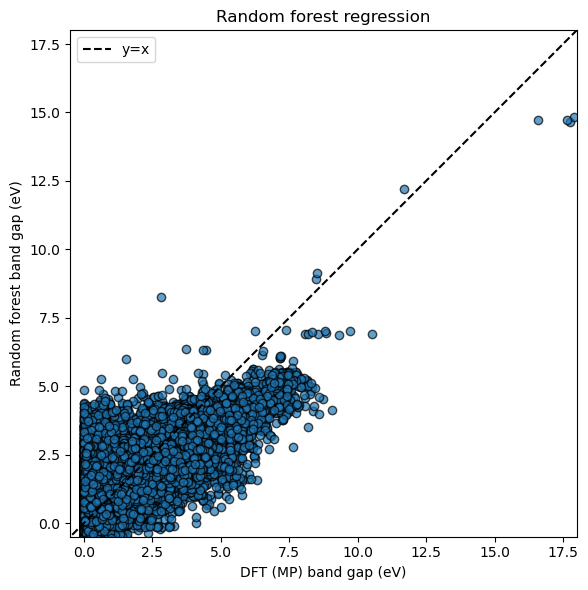

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
from sklearn.model_selection import cross_val_predict

#SUbstitute NaNs with zeros
X = X.fillna(0)

# Get predictions
y_pred = cross_val_predict(lr, X, y, cv=crossvalidation)

# Optionally filter out extreme outliers for better visualization
mask = (y_pred > -1) & (y_pred < 20)
y_plot = np.array(y)[mask]
y_pred_plot = y_pred[mask]

plt.figure(figsize=(6, 6))  # Square figure
plt.scatter(y_plot, y_pred_plot, alpha=0.7, edgecolor='k')
plt.plot([-1, 18], [-1, 18], 'k--', label="y=x")  # Diagonal reference line
plt.xlabel('DFT (MP) band gap (eV)')
plt.ylabel('Random forest band gap (eV)')
plt.title('Linear regression')
plt.xlim(-0.5, 18)
plt.ylim(-0.5, 18)
plt.gca().set_aspect('equal', adjustable='box')  # Make axes square
plt.tight_layout()
plt.legend()
plt.show()

### Random Forest

In [ ]:
from sklearn.ensemble import RandomForestRegressor

rf = RandomForestRegressor(n_estimators=50, random_state=1)

rf.fit(X, y)
print('training R2 = ' + str(round(rf.score(X, y), 3)))
print('training RMSE = %.3f' % np.sqrt(mean_squared_error(y_true=y, y_pred=rf.predict(X))))


training R2 = 0.979
training RMSE = 0.221


In [ ]:
# compute cross validation scores for random forest model
r2_scores = cross_val_score(rf, X, y, scoring='r2', cv=crossvalidation, n_jobs=-1)
scores = cross_val_score(rf, X, y, scoring='neg_mean_squared_error', cv=crossvalidation, n_jobs=-1)
rmse_scores = [np.sqrt(abs(s)) for s in scores]

print('Cross-validation results:')
print('Folds: %i, mean R2: %.3f' % (len(scores), np.mean(np.abs(r2_scores))))
print('Folds: %i, mean RMSE: %.3f' % (len(scores), np.mean(np.abs(rmse_scores))))

Cross-validation results:
Folds: 20, mean R2: 0.853
Folds: 20, mean RMSE: 0.581


In [ ]:
pf_rf = PlotlyFig(x_title='DFT (MP) band gap (eV)',
                  y_title='Random forest band gap (eV)',
                  title='Random forest regression',
                  mode='notebook',
                  filename="rf_regression.html")

pf_rf.xy([(y, cross_val_predict(rf, X, y, cv=crossvalidation)), ([0, 10], [0, 10])],
      labels=df_mp['formula_pretty'].values, modes=['markers', 'lines'],
      lines=[{}, {'color': 'black', 'dash': 'dash'}], showlegends=False)



KeyboardInterrupt: 

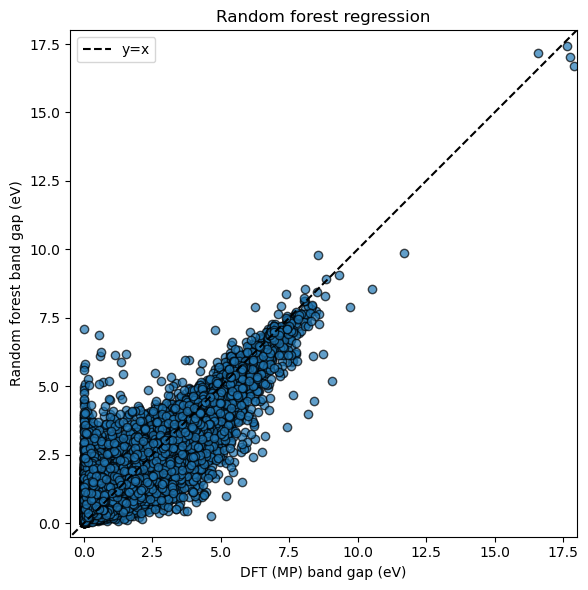

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
from sklearn.model_selection import cross_val_predict

# Get predictions
y_pred = cross_val_predict(rf, X, y, cv=crossvalidation)

# Optionally filter out extreme outliers for better visualization
mask = (y_pred > -1) & (y_pred < 20)
y_plot = np.array(y)[mask]
y_pred_plot = y_pred[mask]

plt.figure(figsize=(6, 6))  # Square figure
plt.scatter(y_plot, y_pred_plot, alpha=0.7, edgecolor='k')
plt.plot([-1, 18], [-1, 18], 'k--', label="y=x")  # Diagonal reference line
plt.xlabel('DFT (MP) band gap (eV)')
plt.ylabel('Random forest band gap (eV)')
plt.title('Random forest regression')
plt.xlim(-0.5, 18)
plt.ylim(-0.5, 18)
plt.gca().set_aspect('equal', adjustable='box')  # Make axes square
plt.tight_layout()
plt.legend()
plt.show()

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
from sklearn.model_selection import cross_val_predict

# Get predictions
y_pred = cross_val_predict(rf, X, y, cv=crossvalidation)

# Filter out extreme outliers for better visualization
mask = (y_pred > -1) & (y_pred < 20)
y_plot = np.array(y)[mask]
y_pred_plot = y_pred[mask]

plt.figure(figsize=(6, 6))  # Square figure
plt.scatter(y_plot, y_pred_plot, alpha=0.7, edgecolor='k', label='Data')
plt.plot([-1, 18], [-1, 18], 'k--', label="y=x", color='red')  # Diagonal reference line

# Best fit line
coeffs = np.polyfit(y_plot, y_pred_plot, 1)
x_fit = np.linspace(y_plot.min(), 18, 100)
y_fit = coeffs[0] * x_fit + coeffs[1]
plt.plot(x_fit, y_fit, 'k--', label='Best fit, y={:.2f}x + {:.2f}'.format(coeffs[0], coeffs[1]), color='blue')

plt.xlabel('DFT (MP) band gap (eV)')
plt.ylabel('Random forest band gap (eV)')
plt.title('Random forest regression')
plt.xlim(-0.5, 18)
plt.ylim(-0.5, 18)
plt.gca().set_aspect('equal', adjustable='box')  # Make axes square
plt.tight_layout()
plt.legend()
plt.show()

KeyboardInterrupt: 

In [ ]:
print(X)
print(len(X))

NameError: name 'X' is not defined

## Direct error modelling trial 

### 3split-L1 (absolute error)

In [139]:
## Direct error modelling trial 
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split
#SUbstitute NaNs with zeros
X = X.fillna(0)

# 1. Split into train, validation, and test (3-split)
X_temp, X_test, y_temp, y_test = train_test_split(X, y, test_size=0.2, random_state=7)
X_train, X_val, y_train, y_val = train_test_split(X_temp, y_temp, test_size=0.5, random_state=7)

# 2. Train main model on train
main_model = RandomForestRegressor(n_estimators=50, random_state=1)
main_model.fit(X_train, y_train)

# 3. Predict on validation, compute errors
y_val_pred = main_model.predict(X_val)
errors_val = y_val_pred-y_val    #np.abs(y_val_pred - y_val)


In [ ]:
len(X_test) 

491

In [ ]:
len(X_train) 

981

In [ ]:
len(X_temp)

1963

In [ ]:
len(X_val)

982

In [140]:
from sklearn.ensemble import GradientBoostingRegressor
# 4. Train error model on validation


error_model = GradientBoostingRegressor(n_estimators=50, random_state=2)
y_val_pred = main_model.predict(X_val)
errors_val = np.abs(y_val_pred - y_val)

error_model.fit(X_val, errors_val)

# Ensure y_test is a NumPy array for positional indexing
y_test_np = np.array(y_test)

# 5. Predict on test set
y_test_pred = main_model.predict(X_test)
y_test_error_pred = error_model.predict(X_test)
true_test_error = np.abs(y_test_pred - y_test_np)


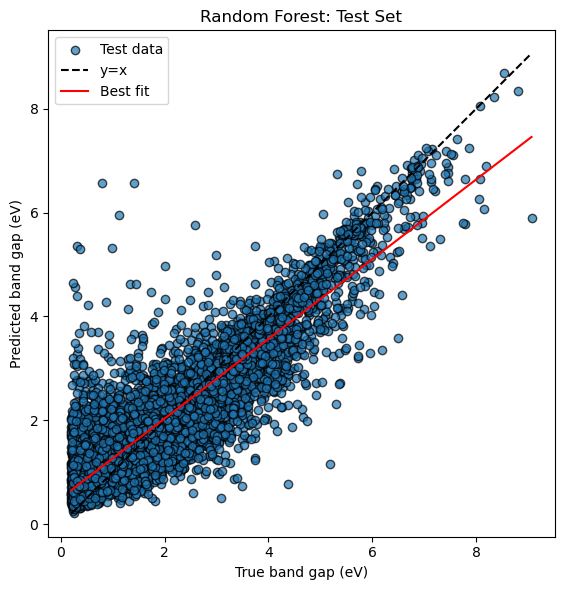

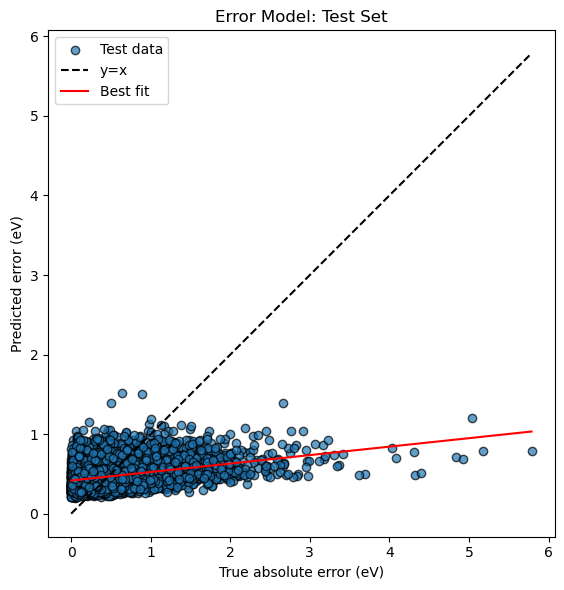

Predicted band gap: 2.11, Predicted error: 0.60, True error: 0.56
Predicted band gap: 1.36, Predicted error: 0.36, True error: 0.15
Predicted band gap: 2.44, Predicted error: 0.46, True error: 0.13
Predicted band gap: 3.65, Predicted error: 0.54, True error: 0.01
Predicted band gap: 3.27, Predicted error: 0.47, True error: 0.16


In [141]:
import matplotlib.pyplot as plt
# 6. Plot: Main model predictions vs true values (test set)
plt.figure(figsize=(6, 6))
plt.scatter(y_test, y_test_pred, alpha=0.7, edgecolor='k', label='Test data')
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', label='y=x')
# Best fit line
coeffs = np.polyfit(y_test, y_test_pred, 1)
x_fit = np.linspace(y_test.min(), y_test.max(), 100)
y_fit = coeffs[0] * x_fit + coeffs[1]
plt.plot(x_fit, y_fit, 'r-', label='Best fit')
plt.xlabel('True band gap (eV)')
plt.ylabel('Predicted band gap (eV)')
plt.title('Random Forest: Test Set')
plt.legend()
plt.tight_layout()
plt.gca().set_aspect('equal', adjustable='box')
plt.show()

# 7. Plot: Error model predictions vs true errors (test set)
plt.figure(figsize=(6, 6))
plt.scatter(true_test_error, y_test_error_pred, alpha=0.7, edgecolor='k', label='Test data')
plt.plot([0, max(true_test_error.max(), y_test_error_pred.max())], 
         [0, max(true_test_error.max(), y_test_error_pred.max())], 'k--', label='y=x')
# Best fit line for error model
coeffs_err = np.polyfit(true_test_error, y_test_error_pred, 1)
x_fit_err = np.linspace(0, max(true_test_error.max(), y_test_error_pred.max()), 100)
y_fit_err = coeffs_err[0] * x_fit_err + coeffs_err[1]
plt.plot(x_fit_err, y_fit_err, 'r-', label='Best fit')
plt.xlabel('True absolute error (eV)')
plt.ylabel('Predicted error (eV)')
plt.title('Error Model: Test Set')
plt.legend()
plt.tight_layout()
plt.gca().set_aspect('equal', adjustable='box')
plt.show()

# 8. Example output for first 5 test samples
for i in range(5):
    print(f"Predicted band gap: {y_test_pred[i]:.2f}, Predicted error: {y_test_error_pred[i]:.2f}, True error: {true_test_error[i]:.2f}")

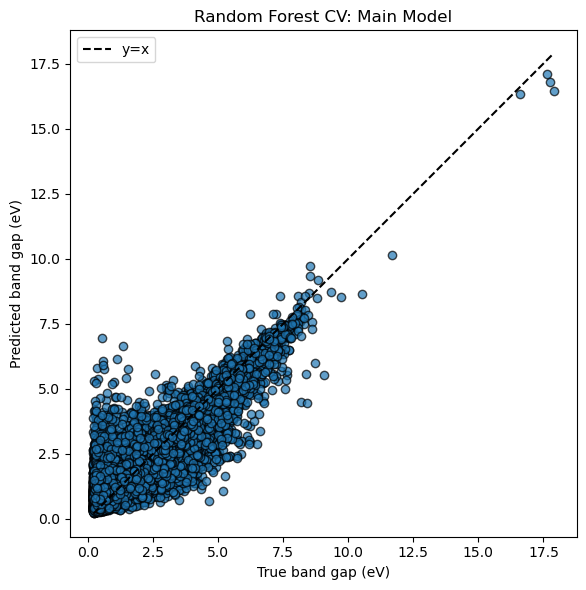

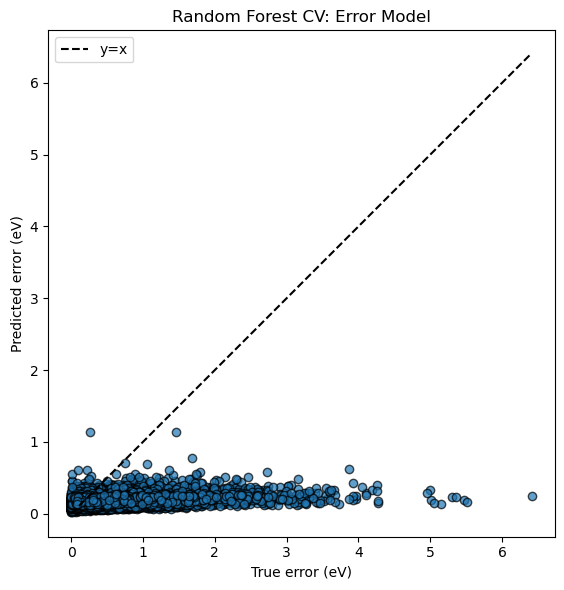

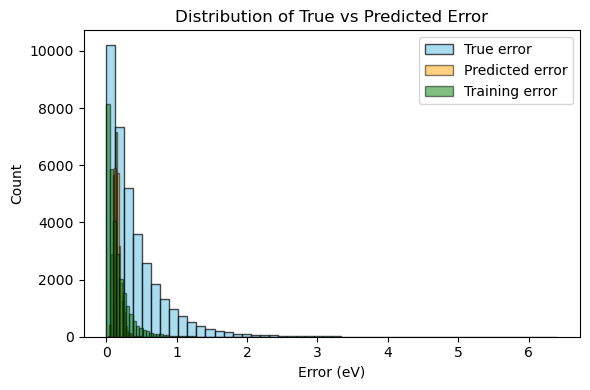

In [143]:
import numpy as np
import pandas as pd
from sklearn.model_selection import KFold
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression

# Ensure X and y are pandas structures
if isinstance(X, np.ndarray):
    X = pd.DataFrame(X)
if isinstance(y, np.ndarray):
    y = pd.Series(y)

X = X.fillna(0)  # Substitute NaNs with zeros

kf = KFold(n_splits=5, shuffle=True, random_state=42)
main_preds = np.zeros(len(y))
bias_preds = np.zeros(len(y))
true_errors = np.zeros(len(y))

for train_idx, val_idx in kf.split(X):
    X_train, X_val = X.iloc[train_idx], X.iloc[val_idx]
    y_train, y_val = y.iloc[train_idx], y.iloc[val_idx]

    # Train main model
    main_model = RandomForestRegressor(n_estimators=100, random_state=1)
    main_model.fit(X_train, y_train)
    y_val_pred = main_model.predict(X_val)
    y_train_pred = main_model.predict(X_train)

    # Compute bias (signed error) on training set
    error_train = np.abs(y_train_pred - y_train)

    # Train error (bias) model
    bias_model = GradientBoostingRegressor(n_estimators=100, random_state=2)
    bias_model.fit(X_train, error_train)
    bias_pred_val = bias_model.predict(X_val)

    # Store results
    main_preds[val_idx] = y_val_pred
    bias_preds[val_idx] = bias_pred_val
    true_errors[val_idx] = np.abs(y_val_pred - y_val)

# Plot main model predictions
plt.figure(figsize=(6, 6))
plt.scatter(y, main_preds, alpha=0.7, edgecolor='k')
plt.plot([y.min(), y.max()], [y.min(), y.max()], 'k--', label='y=x')
plt.xlabel('True band gap (eV)')
plt.ylabel('Predicted band gap (eV)')
plt.title('Random Forest CV: Main Model')
plt.legend()
plt.tight_layout()
plt.gca().set_aspect('equal', adjustable='box')
plt.show()

# Plot bias model predictions vs true bias
plt.figure(figsize=(6, 6))
plt.scatter(true_errors, bias_preds, alpha=0.7, edgecolor='k')
plt.plot([true_errors.min(), true_errors.max()], 
         [true_errors.min(), true_errors.max()], 'k--', label='y=x')
plt.xlabel('True error (eV)')
plt.ylabel('Predicted error (eV)')
plt.title('Random Forest CV: Error Model')
plt.legend()
plt.tight_layout()
plt.gca().set_aspect('equal', adjustable='box')
plt.show()

# Plot distributions
plt.figure(figsize=(6, 4))
plt.hist(true_errors, bins=50, color='skyblue', edgecolor='k', alpha=0.7, label='True error')
plt.hist(bias_preds, bins=50, color='orange', edgecolor='k', alpha=0.5, label='Predicted error')
plt.hist(error_train, bins=50, color='green', edgecolor='k', alpha=0.5, label='Training error')
plt.xlabel('Error (eV)')
plt.ylabel('Count')
plt.title('Distribution of True vs Predicted Error')
plt.legend()
plt.tight_layout()
plt.show()

### Direct Loss Estimation by NannyML

### Model with positive and negative valeus of error. 

In [130]:
#OK VERY SIMPLE MODEL WITHOUT CROSS VALIDATION
import numpy as np
import pandas as pd
from sklearn.model_selection import KFold
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from quantile_forest import RandomForestQuantileRegressor  # optional, not needed if not using quantiles frp
from matplotlib import pyplot as plt



# Ensure X and y are pandas structures
if isinstance(X, np.ndarray):
    X = pd.DataFrame(X)
if isinstance(y, np.ndarray):
    y = pd.Series(y)

X = X.fillna(0)


#Split into train, validation, and test (3-split)
X_temp, X_test, y_temp, y_test = train_test_split(X, y, test_size=0.2, random_state=7)
X_train, X_val, y_train, y_val = train_test_split(X_temp, y_temp, test_size=0.5, random_state=7)

#Train main model on train
main_model = RandomForestRegressor(n_estimators=50, random_state=1)
main_model.fit(X_train, y_train)

#Predict on validation
y_val_pred = main_model.predict(X_val)
errors_val = y_val_pred - y_val #calculate errors of the main model on the validation set

#train the error model
error_model = GradientBoostingRegressor(n_estimators=50, random_state=2)
error_model.fit(X_val, errors_val)

# Ensure y_test is a NumPy array for positional indexing
y_test_np = np.array(y_test)

# Predict on test set
y_test_pred = main_model.predict(X_test) #predict band gaps on the test set using main model 
y_test_error_pred = error_model.predict(X_test) # predict errors on the test set using error model
true_test_error = y_test_pred - y_test_np #calculate actual errors on the test set



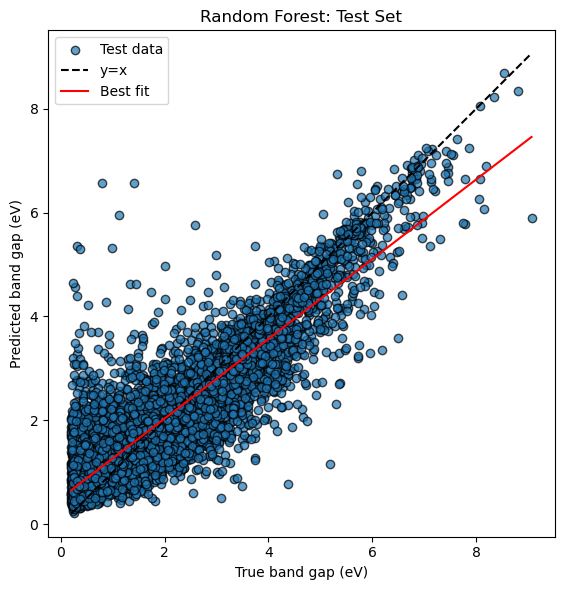

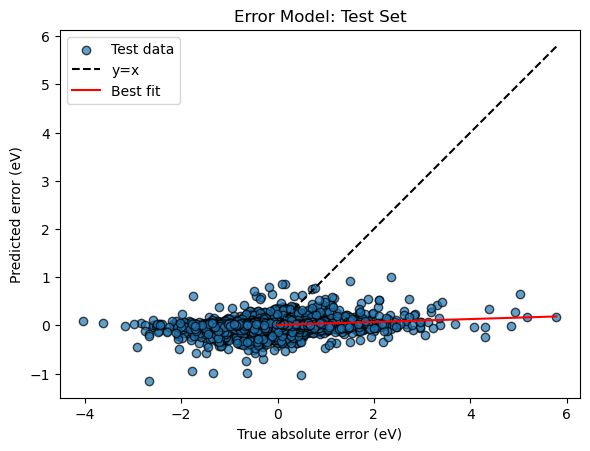

Predicted band gap: 2.11, Predicted error: 0.00, True error: -0.56
Predicted band gap: 1.36, Predicted error: 0.04, True error: 0.15
Predicted band gap: 2.44, Predicted error: -0.13, True error: -0.13
Predicted band gap: 3.65, Predicted error: 0.03, True error: 0.01
Predicted band gap: 3.27, Predicted error: 0.01, True error: 0.16


In [ ]:
plt.figure(figsize=(6, 6))
plt.scatter(y_test, y_test_pred, alpha=0.7, edgecolor='k', label='Test data')
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', label='y=x')
# Best fit line
coeffs = np.polyfit(y_test, y_test_pred, 1)
x_fit = np.linspace(y_test.min(), y_test.max(), 100)
y_fit = coeffs[0] * x_fit + coeffs[1]
plt.plot(x_fit, y_fit, 'r-', label='Best fit')
plt.xlabel('True band gap (eV)')
plt.ylabel('Predicted band gap (eV)')
plt.title('Random Forest: Test Set')
plt.legend()
plt.tight_layout()
plt.gca().set_aspect('equal', adjustable='box')
plt.show()

#Error model predictions vs true errors (test set)
plt.figure(figsize=(6, 6))
plt.scatter(true_test_error, y_test_error_pred, alpha=0.7, edgecolor='k', label='Test data')
plt.plot([0, max(true_test_error.max(), y_test_error_pred.max())], 
         [0, max(true_test_error.max(), y_test_error_pred.max())], 'k--', label='y=x')
# Best fit line for error model
coeffs_err = np.polyfit(true_test_error, y_test_error_pred, 1)
x_fit_err = np.linspace(0, max(true_test_error.max(), y_test_error_pred.max()), 100)
y_fit_err = coeffs_err[0] * x_fit_err + coeffs_err[1]
plt.plot(x_fit_err, y_fit_err, 'r-', label='Best fit')
plt.xlabel('True absolute error (eV)')
plt.ylabel('Predicted error (eV)')
plt.title('Error Model: Test Set')
plt.legend()
plt.tight_layout()
plt.gca().set_aspect('equal', adjustable='box')
plt.show()



# 8. Example output for first 5 test samples
for i in range(5):
    print(f"Predicted band gap: {y_test_pred[i]:.2f}, Predicted error: {y_test_error_pred[i]:.2f}, True error: {true_test_error[i]:.2f}")

In [136]:
# After training error_model
importances = main_model.feature_importances_
feature_names = X.columns
top_features = sorted(zip(feature_names, importances), key=lambda x: -x[1])[:10]
print("Top features for error prediction:")
for name, imp in top_features:
    print(f"{name}: {imp:.4f}")

Top features for error prediction:
MagpieData maximum NdValence: 0.2102
formation_energy_per_atom: 0.1056
energy_above_hull: 0.0864
MagpieData mean MeltingT: 0.0352
MagpieData mode MendeleevNumber: 0.0348
MagpieData mode MeltingT: 0.0297
MagpieData mean GSbandgap: 0.0172
density: 0.0164
MagpieData mean NUnfilled: 0.0158
MagpieData mean CovalentRadius: 0.0155


In [134]:
# After training error_model
importances = error_model.feature_importances_
feature_names = X.columns
top_features = sorted(zip(feature_names, importances), key=lambda x: -x[1])[:10]
print("Top features for error prediction:")
for name, imp in top_features:
    print(f"{name}: {imp:.4f}")

Top features for error prediction:
formation_energy_per_atom: 0.1097
MagpieData range NUnfilled: 0.0587
density: 0.0547
energy_above_hull: 0.0507
volume: 0.0490
MagpieData avg_dev MeltingT: 0.0460
MagpieData avg_dev Column: 0.0453
MagpieData maximum NValence: 0.0393
MagpieData mean GSbandgap: 0.0375
MagpieData maximum GSvolume_pa: 0.0267


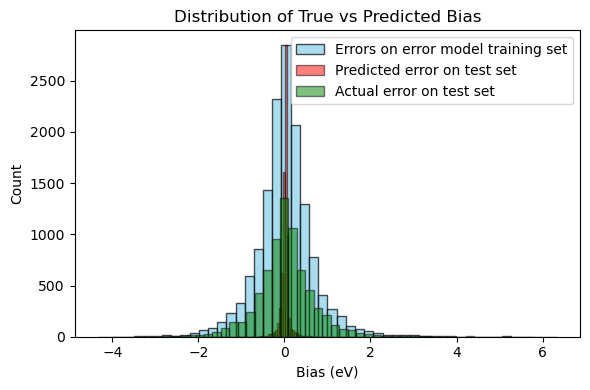

In [135]:
# Plot distributions
plt.figure(figsize=(6, 4))
plt.hist(errors_val, bins=50, color='skyblue', edgecolor='k', alpha=0.7, label='Errors on error model training set')
plt.hist(y_test_error_pred, bins=50, color='red', edgecolor='k', alpha=0.5, label='Predicted error on test set')
plt.hist(true_test_error, bins=50, color='green', edgecolor='k', alpha=0.5, label='Actual error on test set')
plt.xlabel('Bias (eV)')
plt.ylabel('Count')
plt.title('Distribution of True vs Predicted Bias')
plt.legend()
plt.tight_layout()
plt.show()

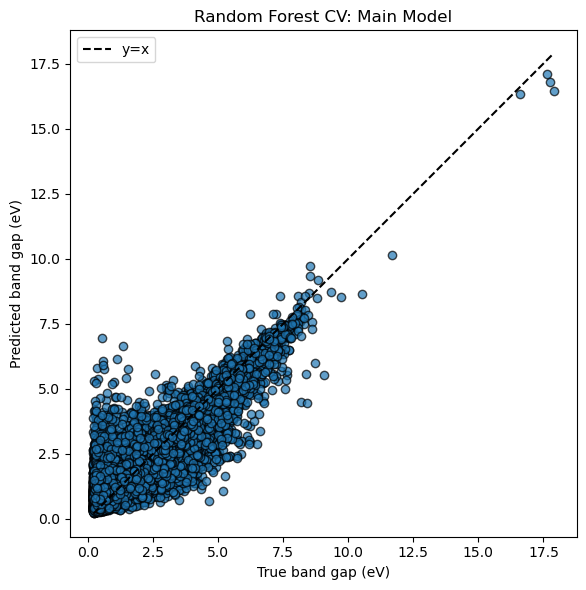

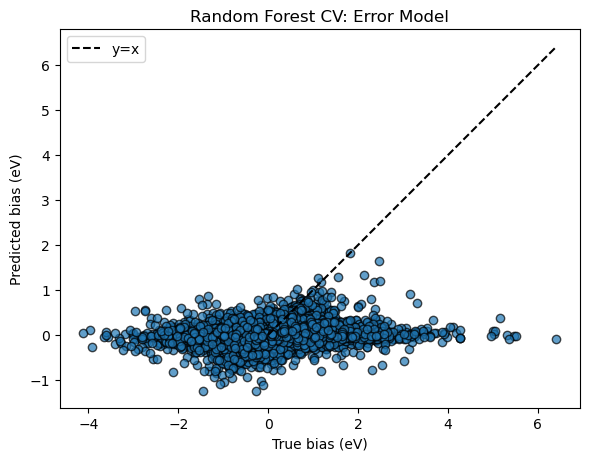

In [137]:
import numpy as np
import pandas as pd
from sklearn.model_selection import KFold
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from quantile_forest import RandomForestQuantileRegressor  # optional, not needed if not using quantiles frp
from matplotlib import pyplot as plt


# Ensure X and y are pandas structures
if isinstance(X, np.ndarray):
    X = pd.DataFrame(X)
if isinstance(y, np.ndarray):
    y = pd.Series(y)

X = X.fillna(0)  # Substitute NaNs with zeros

# Initialize KFold cross-validation
kf = KFold(n_splits=5, shuffle=True, random_state=42)
main_preds = np.zeros(len(y))
error_preds = np.zeros(len(y))
true_errors = np.zeros(len(y))

for train_idx, val_idx in kf.split(X):
    X_train, X_val = X.iloc[train_idx], X.iloc[val_idx]
    y_train, y_val = y.iloc[train_idx], y.iloc[val_idx]

    # Train main model
    main_model = RandomForestRegressor(n_estimators=100, random_state=1)
    main_model.fit(X_train, y_train) #train the main model 
    y_val_pred = main_model.predict(X_val) #predictions on validation set
    y_train_pred = main_model.predict(X_train) #predictions on training set

    # Train signed error model (bias model) 
    signed_errors_train = y_train_pred - y_train  # <-- signed error (can be negative) i.e bias - does the model underpredict or overpredict?
    
    # Use same features to predict bias
    error_model = RandomForestQuantileRegressor(n_estimators=100, random_state=2)
    error_model.fit(X_train, signed_errors_train) #train on the same set as the main model and predict the error (bias) from the main model
    
    signed_error_pred_val = error_model.predict(X_val) # predict the bias on the validation set using the error model


    # Store results
    main_preds[val_idx] = y_val_pred # store main model predictions on the validation set
    error_preds[val_idx] = signed_error_pred_val #error predictions on the validation set

    true_errors[val_idx] = y_val_pred - y_val  # the actual errors on the validation set

# plot both models' cross-validated predictions

plt.figure(figsize=(6, 6))
plt.scatter(y, main_preds, alpha=0.7, edgecolor='k')
plt.plot([y.min(), y.max()], [y.min(), y.max()], 'k--', label='y=x')
plt.xlabel('True band gap (eV)')
plt.ylabel('Predicted band gap (eV)')
plt.title('Random Forest CV: Main Model')
plt.legend()
plt.tight_layout()
plt.gca().set_aspect('equal', adjustable='box')
plt.show()

plt.figure(figsize=(6, 6))
plt.scatter(true_errors, error_preds, alpha=0.7, edgecolor='k')
plt.plot([0, max(true_errors.max(), error_preds.max())], 
         [0, max(true_errors.max(), error_preds.max())], 'k--', label='y=x')
plt.xlabel('True bias (eV)')
plt.ylabel('Predicted bias (eV)')
plt.title('Random Forest CV: Error Model')
plt.legend()
plt.tight_layout()
plt.gca().set_aspect('equal', adjustable='box')
plt.show()

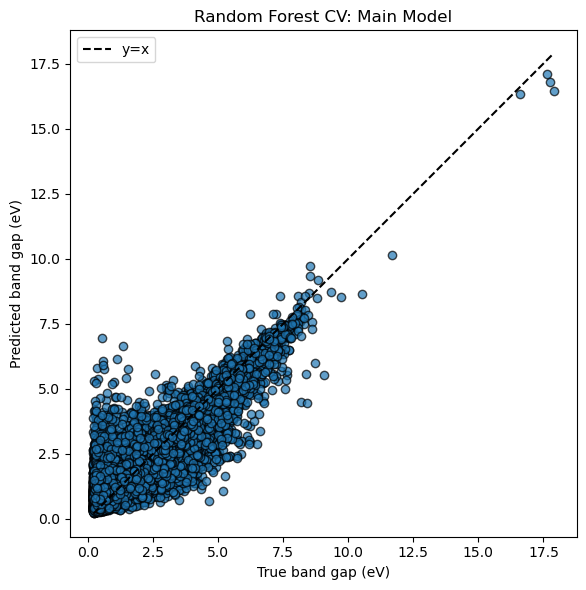

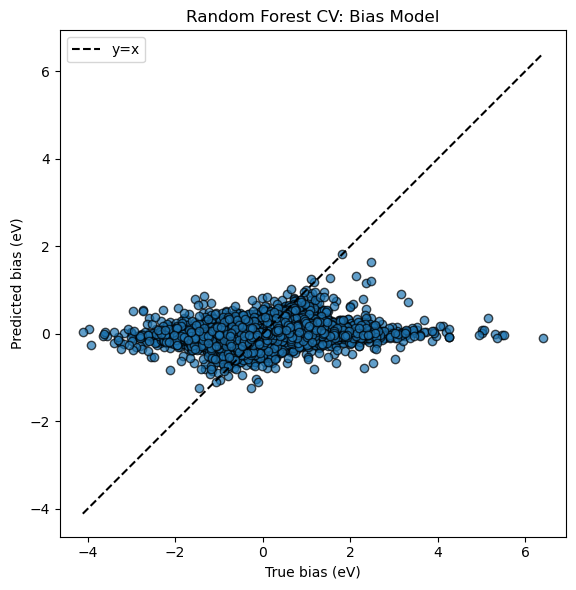

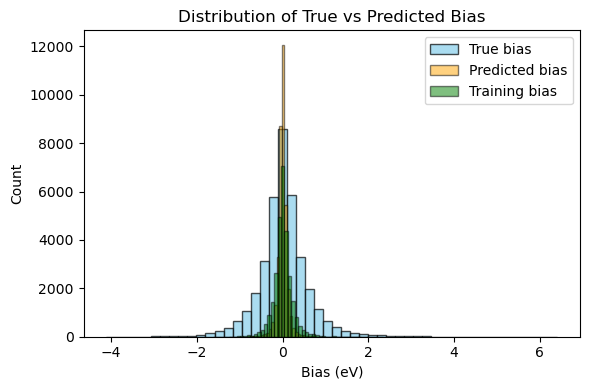

In [ ]:
import numpy as np
import pandas as pd
from sklearn.model_selection import KFold
from sklearn.ensemble import RandomForestRegressor
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression

# Ensure X and y are pandas structures
if isinstance(X, np.ndarray):
    X = pd.DataFrame(X)
if isinstance(y, np.ndarray):
    y = pd.Series(y)

X = X.fillna(0)  # Substitute NaNs with zeros

kf = KFold(n_splits=5, shuffle=True, random_state=42)
main_preds = np.zeros(len(y))
bias_preds = np.zeros(len(y))
true_biases = np.zeros(len(y))

for train_idx, val_idx in kf.split(X):
    X_train, X_val = X.iloc[train_idx], X.iloc[val_idx]
    y_train, y_val = y.iloc[train_idx], y.iloc[val_idx]

    # Train main model
    main_model = RandomForestRegressor(n_estimators=100, random_state=1)
    main_model.fit(X_train, y_train)
    y_val_pred = main_model.predict(X_val)
    y_train_pred = main_model.predict(X_train)

    # Compute bias (signed error) on training set
    bias_train = y_train_pred - y_train

    # Train error (bias) model
    bias_model = RandomForestQuantileRegressor(n_estimators=100, random_state=2)
    bias_model.fit(X_train, bias_train)
    bias_pred_val = bias_model.predict(X_val)

    # Store results
    main_preds[val_idx] = y_val_pred
    bias_preds[val_idx] = bias_pred_val
    true_biases[val_idx] = y_val_pred - y_val

# Plot main model predictions
plt.figure(figsize=(6, 6))
plt.scatter(y, main_preds, alpha=0.7, edgecolor='k')
plt.plot([y.min(), y.max()], [y.min(), y.max()], 'k--', label='y=x')
plt.xlabel('True band gap (eV)')
plt.ylabel('Predicted band gap (eV)')
plt.title('Random Forest CV: Main Model')
plt.legend()
plt.tight_layout()
plt.gca().set_aspect('equal', adjustable='box')
plt.show()

# Plot bias model predictions vs true bias
plt.figure(figsize=(6, 6))
plt.scatter(true_biases, bias_preds, alpha=0.7, edgecolor='k')
plt.plot([true_biases.min(), true_biases.max()], 
         [true_biases.min(), true_biases.max()], 'k--', label='y=x')
plt.xlabel('True bias (eV)')
plt.ylabel('Predicted bias (eV)')
plt.title('Random Forest CV: Bias Model')
plt.legend()
plt.tight_layout()
plt.gca().set_aspect('equal', adjustable='box')
plt.show()

# Plot distributions
plt.figure(figsize=(6, 4))
plt.hist(true_biases, bins=50, color='skyblue', edgecolor='k', alpha=0.7, label='True bias')
plt.hist(bias_preds, bins=50, color='orange', edgecolor='k', alpha=0.5, label='Predicted bias')
plt.hist(bias_train, bins=50, color='green', edgecolor='k', alpha=0.5, label='Training bias')
plt.xlabel('Bias (eV)')
plt.ylabel('Count')
plt.title('Distribution of True vs Predicted Bias')
plt.legend()
plt.tight_layout()
plt.show()

In [ ]:
# After training bias_model
importances = bias_model.feature_importances_
feature_names = X.columns
top_features = sorted(zip(feature_names, importances), key=lambda x: -x[1])[:10]
print("Top features for bias prediction:")
for name, imp in top_features:
    print(f"{name}: {imp:.4f}")

Top features for bias prediction:
energy_above_hull: 0.0868
density: 0.0853
formation_energy_per_atom: 0.0795
volume: 0.0703
nsites: 0.0338
MagpieData mean Electronegativity: 0.0299
MagpieData avg_dev Column: 0.0223
MagpieData range Electronegativity: 0.0209
MagpieData mean MeltingT: 0.0192
MagpieData mean CovalentRadius: 0.0182
